# Email Fraud Detection: Data Analysis

**By Ross Willett**

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Email-Fraud-Detection:-Data-Analysis" data-toc-modified-id="Email-Fraud-Detection:-Data-Analysis-1">Email Fraud Detection: Data Analysis</a></span><ul class="toc-item"><li><span><a href="#File-Introduction" data-toc-modified-id="File-Introduction-1.1">File Introduction</a></span></li><li><span><a href="#Initial-Formatting" data-toc-modified-id="Initial-Formatting-1.2">Initial Formatting</a></span></li><li><span><a href="#Analyzing-Email-Words" data-toc-modified-id="Analyzing-Email-Words-1.3">Analyzing Email Words</a></span><ul class="toc-item"><li><span><a href="#Analyzing-Top-Fraud-Email-Words" data-toc-modified-id="Analyzing-Top-Fraud-Email-Words-1.3.1">Analyzing Top Fraud Email Words</a></span></li><li><span><a href="#Analyzing-Top-Ham-Email-Words" data-toc-modified-id="Analyzing-Top-Ham-Email-Words-1.3.2">Analyzing Top Ham Email Words</a></span></li><li><span><a href="#Analyzing-Fraud-NGrams" data-toc-modified-id="Analyzing-Fraud-NGrams-1.3.3">Analyzing Fraud NGrams</a></span></li><li><span><a href="#Analyzing-Ham-NGrams" data-toc-modified-id="Analyzing-Ham-NGrams-1.3.4">Analyzing Ham NGrams</a></span></li><li><span><a href="#Look-at-Non-Vectorized-Columns" data-toc-modified-id="Look-at-Non-Vectorized-Columns-1.3.5">Look at Non-Vectorized Columns</a></span></li><li><span><a href="#Compare-Fraud-to-Ham-Counts" data-toc-modified-id="Compare-Fraud-to-Ham-Counts-1.3.6">Compare Fraud to Ham Counts</a></span></li></ul></li><li><span><a href="#Check-for-Correlations-Between-Variables" data-toc-modified-id="Check-for-Correlations-Between-Variables-1.4">Check for Correlations Between Variables</a></span></li><li><span><a href="#Conclusions" data-toc-modified-id="Conclusions-1.5">Conclusions</a></span></li></ul></li></ul></div>

## File Introduction

In this file, the cleaned data will be loaded and divided into remainder and test sets. The text content of the remainder will then vectorized and the differences between the non-fraudulent ("ham") and fraud emails compared. Then the characteristics of the overall remainder data set will be examined.

## Initial Formatting

In order to prepare the data for modeling, the data will be cursorily examined and split into feature and target values. Then, in order to prevent any data leakage into the analysis, the data must first be first split into a remainder and test set. This will ensure the test data is not being biased by the results of the initial analysis.

In [1]:
# Import standard data manipulation libraries
import pandas as pd
import numpy as np

# Import regex library
import re

# Plotting libraries
import matplotlib.pyplot as plt
import seaborn as sns

# Import natural language processing libraries
from sklearn.feature_extraction.text import CountVectorizer

# Model selection libraries
from sklearn.model_selection import train_test_split

# Import custom tokenizer
from Tokenizer import custom_tokenizer

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/rosswillett/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [103]:
# Import warnings and supress them
import warnings
warnings.filterwarnings('ignore')

In [104]:
# Configure Pandas to show all columns / rows
pd.options.display.max_columns = 2000
pd.options.display.max_rows = 2000
# Set column max width larger
pd.set_option('display.max_colwidth', 200)

In [105]:
# Set up matplotlib to use nice styles
plt.style.use('ggplot')

In [106]:
# Load data from phishing email csv
email_df = pd.read_csv('./data/fraud_all_data_clean_final.csv')

In [107]:
# Examining the shape of the fraud data
email_df.shape

(12401, 6)

In [108]:
# Looks at the split between fraud and non-fraud emails in the data
email_df['fraud'].value_counts()

0    6743
1    5658
Name: fraud, dtype: int64

As demonstrated by the counts of ham to fraud emails there is a fairly even split in the data with 46% of it being fraudulent. This is good for modeling since it means that the models will not be trained excessively on one type of data only.

In [109]:
# Set the feature and target data frames
X = email_df.drop(columns=['fraud'])
y = email_df.loc[:, ['fraud']]

In [110]:
# Split the data frames into test and remainder data
X_remainder, X_test, y_remainder, y_test = train_test_split(
    X,
    y,
    stratify=y,
    random_state=1337,
    test_size=0.2,
)
# Reset the indexes of the resulting data frames so the counts return to 1 to n
X_remainder.reset_index(drop=True, inplace=True)
X_test.reset_index(drop=True, inplace=True)
y_remainder.reset_index(drop=True, inplace=True)
y_test.reset_index(drop=True, inplace=True)

The separated data should now be saved so it can be loaded for use in other files.

In [111]:
# Save X remainder
X_remainder.to_csv('./data/X_remainder.csv', index=False)
# Save X test
X_test.to_csv('./data/X_test.csv', index=False)
# Save y remainder
y_remainder.to_csv('./data/y_remainder.csv', index=False)
# Save y test
y_test.to_csv('./data/y_test.csv', index=False)

In [112]:
# Split the data frames into train and validation data
X_train, X_validation, y_train, y_validation = train_test_split(
    X_remainder,
    y_remainder,
    stratify=y_remainder,
    random_state=1337,
    test_size=0.2,
)
# Reset the indexes of the resulting data frames so the counts return to 1 to n
X_train.reset_index(drop=True, inplace=True)
X_validation.reset_index(drop=True, inplace=True)
y_train.reset_index(drop=True, inplace=True)
y_validation.reset_index(drop=True, inplace=True)

In [113]:
# Examining the content of the fraud validation data set
X_validation[y_validation['fraud'] == 1]

,content,unsecure_link_count,secure_link_count,numbers_count,word_count
0,FROM LEE THE MANAGER FOREIGN REMITTANCE DEPARTMENT DEVELOPMENT BANK DEAR PARTNER TOP SECRET I AM LEE THE MANAGER IN CHARGE OF AND ACCOUNTING SECTION OF DEVELOPMENT BANK DEVELOPMENT BANK WEST WITH ...,1,0,57,504
2,Hello friend Please bear with me for now What I have may be of interest to you It is a business proposal that will be beneficial to you and me I live in United Kingdom I am old and I have been wor...,1,0,9,218
3,Dear Friend I am Regional Manager of Bank and also the personal account officer of Late Stella the wife of Who last year of in while trying to undergo medical surgery She made a fixed deposit in t...,1,0,7,170
4,Management Dear Treasury Management user Our Technical Unit is doing a Banking update By following the link below you will open the procedure of the user confirmation portal confirm banking Confir...,2,0,2,154
7,Dear friend I am Henry manager audit account department of Development Bank A In my department we discovered an abandoned sum of MILLION TH REE HUNDRED THOUSAND UNITED in an that to one of our for...,0,0,6,259
8,From Maria I Am A But Am In refugee camp Cote maria One I am a girl of old my name is Maria the child of Gift I am an I lost my a couple of the last war in and now i am here in cote the refugee c...,2,0,9,386
11,FREE MOVIE This advertisement is being sent by a Party where you have to receive or To please follow as provided by the sender at the bottom of this CLAIM YOUR MOVIE CLAIM YOUR MOVIE You are this ...,0,0,7,95
13,Good Day You may be surprise to receive this since you do not know me I am the son of the late president of Democratic Republic Of President now The Republic of under the leadership of the son of ...,0,0,20,333
14,Salutation respect pour de assistance de importance aide la migration la fortune ai de mon re sierra de la unique funt Bah sa mort mon re tait extraction or de la de en Sierra fi la mine de or ass...,1,0,115,190
15,Attention Sir I do for see the surprise this letter will bring to you as it comes from a stranger How ever be rest assured that it comes with the best of How ever your address was courtesy of a bu...,0,0,14,404


## Analyzing Email Words

In order to gain a better understanding of the feature differences between fraud emails and ham emails, the data set should be first divided by category. The text contents of each of these email types can then be count vectorized and the use of words in each type compared. The count vectorizer that will be implemented uses a custom tokenizer that has been created for this purpose. (See `tokenizer.py` for code) This tokenizer removes all non-alphabetical characters, removes English stop words and performs stemming on the words in the text. This is done to remove words that have little semantic value and combine certain words which indicate similar meaning.

In [114]:
# Put the features of all fraud emails into one data frame
fraud_df = X_remainder[y_remainder['fraud'] == 1].reset_index(drop=True)
# Put the features of all ham emails into one data frame
ham_df = X_remainder[y_remainder['fraud'] == 0].reset_index(drop=True)

### Analyzing Top Fraud Email Words

First the words prevalent in fraud emails will be examined by count vectorizing the text content and summing the results across all documents.

In [115]:
# Initialize the count vectorizer with the custom tokenizer
fraud_word_vectorizer = CountVectorizer(
    tokenizer=custom_tokenizer,
)
# Fit the transformer on the content of the fraud data
fraud_word_vectorizer.fit(fraud_df['content'])
# Get the count vectorized content of the fraud email text data
fraud_word_vectorized = fraud_word_vectorizer.transform(fraud_df['content'])

In [116]:
# Set the text content of fraud emails to a data frame
fraud_word_df = pd.DataFrame(
    data=fraud_word_vectorized.toarray(),
    columns=fraud_word_vectorizer.get_feature_names_out(),
)
# Create a data frame summing the use of each word across all fraud emails and sort in decending order by most used
fraud_word_sum_df = pd.DataFrame(
    {"counts": fraud_word_vectorized.toarray().sum(axis=0)},
    index=fraud_word_vectorizer.get_feature_names_out(),
).sort_values("counts", ascending=False)

In [117]:
# Examine the fraud word data frame
fraud_word_df

aa  aba  abac  abandon  abas  abb  abba  abbot  abduct  abe  aberr  \
0      0    0     0        0     0    0     0      0       0    0      0   
1      0    0     0        0     0    0     0      0       0    0      0   
2      0    0     0        0     0    0     0      0       0    0      0   
3      0    0     0        0     0    0     0      0       0    0      0   
4      0    0     0        0     0    0     0      0       0    0      0   
...   ..  ...   ...      ...   ...  ...   ...    ...     ...  ...    ...   
4521   0    0     0        0     0    0     0      0       0    0      0   
4522   0    0     0        0     0    0     0      0       0    0      0   
4523   0    0     0        0     0    0     0      0       0    0      0   
4524   0    0     0        0     0    0     0      0       0    0      0   
4525   0    0     0        0     0    0     0      0       0    0      0   

      abey  abi  abid  abil  abl  ablaz  abnorm  aboard  abod  aborad  abort  \
0        0    0     0     0    0      0       0       0     0       0      0   
1        0    0     0     0    0      0       0       0     0       0      0   
2        0    0     0     0    0      0       0       0     0       0      0   
3        0    0     0     0    0      0       0       0     0       0      0   
4        0    0     0     0    0      0       0       0     0       0      0   
...    ...  ...   ...   ...  ...    ...     ...     ...   ...     ...    ...   
4521     0    0     0     0    0      0       0       0     0       0      0   
4522     0    0     0     0    0      0       0       0     0       0      0   
4523     0    0     0     0    0      0       0       0     0       0      0   
4524     0    0     0     0    0      0       0       0     0       0      0   
4525     0    0     0     0    0      0       0       0     0       0      0   

      abound  abreast  abroad  abscond  absenc  absent  absolut  absolv  \
0          0        0       0        0       0       0        0       0   
1          0        0       0        0       0       0        0       0   
2          0        0       0        0       0       0        0       0   
3          0        0       0        0       0       0        0       0   
4          0        0       0        0       0       0        0       0   
...      ...      ...     ...      ...     ...     ...      ...     ...   
4521       0        0       0        0       0       0        0       0   
4522       0        0       0        0       0       0        0       0   
4523       0        0       0        0       0       0        0       0   
4524       0        0       0        0       0       0        0       0   
4525       0        0       0        0       0       0        1       0   

      absorb  abstain  abstract  abstrus  abu  abund  abundantli  abus  \
0          0        0         0        0    0      0           0     0   
1          0        0         0        0    0      0           0     0   
2          0        0         0        0    3      0           0     0   
3          0        0         0        0    0      0           0     0   
4          0        0         0        0    0      0           0     0   
...      ...      ...       ...      ...  ...    ...         ...   ...   
4521       0        0         0        0    0      0           0     0   
4522       0        0         0        0    0      0           0     0   
4523       0        0         0        0    0      0           0     0   
4524       0        0         0        0    0      0           0     0   
4525       0        0         0        0    0      0           0     0   

      academ  academi  acced  accept  access  accid  accident  accommod  \
0          0        0      0       0       0      0         0         0   
1          0        0      0       0       0      0         0         0   
2          0        0      0       0       0      0         0         0   
3          0        0      0       0      

In [118]:
# Examine the fraud word sum top values
fraud_word_sum_df.head(10)

,counts
account,11109
bank,8635
money,7850
us,5988
fund,5815
pleas,4888
busi,4329
inform,3857
secur,3759
transact,3721


As demonstrated by the top 10 words that appear in fraud emails, the fraud emails typically refer to accounts, finances or security. These words also appear to have a high frequency of use in the content considering there are only 5658 fraudulent email samples. This may prove useful for any models built on this vectorized content provided the ham emails do not have similar prevalences of these words.

### Analyzing Top Ham Email Words

Now that an idea of prevalent words for fraud emails has been established, frequency of words in ham emails will be examined by count vectorizing the text content and summing the results across all documents.

In [119]:
# Initialize the count vectorizer with the custom tokenizer
ham_word_vectorizer = CountVectorizer(
    tokenizer=custom_tokenizer,
)
# Fit the transformer on the content of the ham data
ham_word_vectorizer.fit(ham_df['content'])
# Get the count vectorized content of the ham email text data
ham_word_vectorized = ham_word_vectorizer.transform(ham_df['content'])

In [120]:
# Set the text content of ham emails to a data frame
ham_word_df = pd.DataFrame(
    data=ham_word_vectorized.toarray(),
    columns=ham_word_vectorizer.get_feature_names_out(),
)
# Create a data frame summing the use of each word across all ham emails and sort in decending order by most used
ham_word_sum_df = pd.DataFrame(
    {"counts": ham_word_vectorized.toarray().sum(axis=0)},
    index=ham_word_vectorizer.get_feature_names_out(),
).sort_values("counts", ascending=False)

In [121]:
# Examine the ham word data frame
ham_word_df

aa  aba  aback  abandon  abb  abba  abbot  abbrevi  abduct  abe  aberr  \
0      0    0      0        0    0     0      0        0       0    0      0   
1      0    0      0        0    0     0      0        0       0    0      0   
2      0    0      0        0    0     0      0        0       0    0      0   
3      0    0      0        0    0     0      0        0       0    0      0   
4      0    0      0        0    0     0      0        0       0    0      0   
...   ..  ...    ...      ...  ...   ...    ...      ...     ...  ...    ...   
5389   0    0      0        0    0     0      0        0       0    0      0   
5390   0    0      0        0    0     0      0        0       0    0      0   
5391   0    0      0        0    0     0      0        0       0    0      0   
5392   0    0      0        0    0     0      0        0       0    0      0   
5393   0    0      0        0    0     0      0        0       0    0      0   

      abet  abey  abhorr  abid  abil  abject  abl  abnorm  aboard  abod  \
0        0     0       0     0     0       0    0       0       0     0   
1        0     0       0     0     0       0    0       0       0     0   
2        0     0       0     0     0       0    0       0       0     0   
3        0     0       0     0     0       0    0       0       0     0   
4        0     0       0     0     0       0    0       0       0     0   
...    ...   ...     ...   ...   ...     ...  ...     ...     ...   ...   
5389     0     0       0     0     0       0    0       0       0     0   
5390     0     0       0     0     0       0    0       0       0     0   
5391     0     0       0     0     0       0    0       0       0     0   
5392     0     0       0     0     0       0    0       0       0     0   
5393     0     0       0     0     0       0    0       0       0     0   

      abolish  abolit  abomin  abort  abound  abreast  abroad  abruptli  \
0           0       0       0      0       0        0       0         0   
1           0       0       0      0       0        0       0         0   
2           0       0       0      0       0        0       0         0   
3           0       0       0      0       0        0       0         0   
4           0       0       0      0       0        0       0         0   
...       ...     ...     ...    ...     ...      ...     ...       ...   
5389        0       0       0      0       0        0       0         0   
5390        0       0       0      0       0        0       0         0   
5391        0       0       0      0       0        0       0         0   
5392        0       0       0      0       0        0       0         0   
5393        0       0       0      0       0        0       0         0   

      absenc  absent  absente  absolut  absorb  absorpt  abstain  abstent  \
0          0       0        0        0       0        0        0        0   
1          0       0        0        0       0        0        0        0   
2          0       0        0        0       0        0        0        0   
3          0       0        0        0       0        0        0        0   
4          0       0        0        0       0        0        0        0   
...      ...     ...      ...      ...     ...      ...      ...      ...   
5389       0       0        0        0       0        0        0        0   
5390       0       0        0        0       0        0        0        0   
5391       0       0        0        0       0        0        0        0   
5392       0       0        0        0       0        0        0        0   
5393       0       0        0        0       0        0        0        0   

      abstin  abstract  abstrus  absurd  absurdli  abu  abund  abundantli  \
0          0         0        0       0         0    0      0           0   
1          0         0        0       0         0    0      0           0   
2          0         0        0       0         0    0      0           0   
3         

In [122]:
# Examine the top 10 ham words
ham_word_sum_df.head(10)

,counts
one,1983
would,1899
time,1892
new,1792
state,1758
work,1739
get,1667
list,1531
like,1529
use,1468


From the results here it can be seen that the most used words tend to have much lower sums compared to those in fraud emails. Furthermore the words here seem mostly related to planning and work.

### Analyzing Fraud NGrams

To gain a better understanding of the word combinations that appear in fraud emails, prevalent 2 to 3 word n-grams will be examined using the same vectorization and summing technique.

In [123]:
# Initialize the count vectorizer with the custom tokenizer
fraud_ngram_vectorizer = CountVectorizer(
    tokenizer=custom_tokenizer,
    min_df=10,
    ngram_range=(2, 3),
)
# Fit the transformer on the content of the fraud data
fraud_ngram_vectorizer.fit(fraud_df['content'])
# Get the count vectorized content of the fraud email text data
fraud_ngram_vectorized = fraud_ngram_vectorizer.transform(fraud_df['content'])

In [124]:
# Create a data frame summing the use of each ngram across all fraud emails and sort in decending order by most used
fraud_ngram_df = pd.DataFrame(
    {"counts": fraud_ngram_vectorized.toarray().sum(axis=0)},
    index=fraud_ngram_vectorizer.get_feature_names_out(),
).sort_values("counts", ascending=False)

In [125]:
# Examine the top 20 ngrams from the fraud ngram data
fraud_ngram_df.head(20)

,counts
next kin,2485
bank account,1264
secur compani,1022
hundr thousand,725
transfer money,615
pleas repli,589
million five,588
five hundr,578
look forward,555
transfer fund,543


As seen by the top used ngrams, the most frequently occurring ngrams relate to monetary figures, using money or bank accounts. The other frequently used ngrams may relate to specific scams where the sender is claiming the recipient has received inheritance, is being contacted by a company for security or a company's customer service. Since most of the words that appear in these ngrams already appear in the most frequently used words and seem to add little value it is unlikely these will be used for email identification.

### Analyzing Ham NGrams

To gain a better understanding of the combination of words that appear in ham emails, prevalent 2 to 3 word n-grams will be examined using the same vectorization and summing technique.

In [126]:
# Initialize the count vectorizer with the custom tokenizer
ham_ngram_vectorizer = CountVectorizer(
    tokenizer=custom_tokenizer,
    min_df=10,
    ngram_range=(2, 3),
)
# Fit the transformer on the content of the ham data
ham_ngram_vectorizer.fit(ham_df['content'])
# Get the count vectorized content of the ham email text data
ham_ngram_vectorized = ham_ngram_vectorizer.transform(ham_df['content'])

In [127]:
# Create a data frame summing the use of each ngram across all ham emails and sort in decending order by most used
ham_ngram_df = pd.DataFrame(
    {"counts": ham_ngram_vectorized.toarray().sum(axis=0)},
    index=ham_ngram_vectorizer.get_feature_names_out(),
).sort_values("counts", ascending=False)

In [128]:
# Examine the top 20 ngrams in the ham emails
ham_ngram_df.head(20)

,counts
ie ie,382
state depart,382
ie mailman,366
ie ie mailman,364
inform list,351
maintain ie,350
list maintain,350
list maintain ie,350
inform list maintain,350
mailman fork,336


Similar to the single word counts, the ngrams for the ham emails seem to have a much lower prevalence. However, a good part of these ngrams seem to have relation to government and "mailman". This likely indicates a prevalence of these types of ham emails within the data set. This may not prove particularly useful for model building since this may reveal a bias in the ham data. For now, no changes will be made due to the low prevalence of these types of combinations but in future iterations changing the content of the ham data will be considered.

### Look at Non-Vectorized Columns

In addition to the text content of the emails the additional columns (i.e. unsecure link counts, secure link counts, number of numbers and word counts) should be examined between the fraud and ham data sets.

In [129]:
# Create a copy of the email data frame
plot_df = pd.concat([X_remainder, y_remainder], axis=1)
# Set the "Fraud" column to "Fraud" or "Ham" based on if the fraud flag is present
plot_df['Fraud'] = np.where(plot_df['fraud'] == 1, 'Fraud', 'Ham')

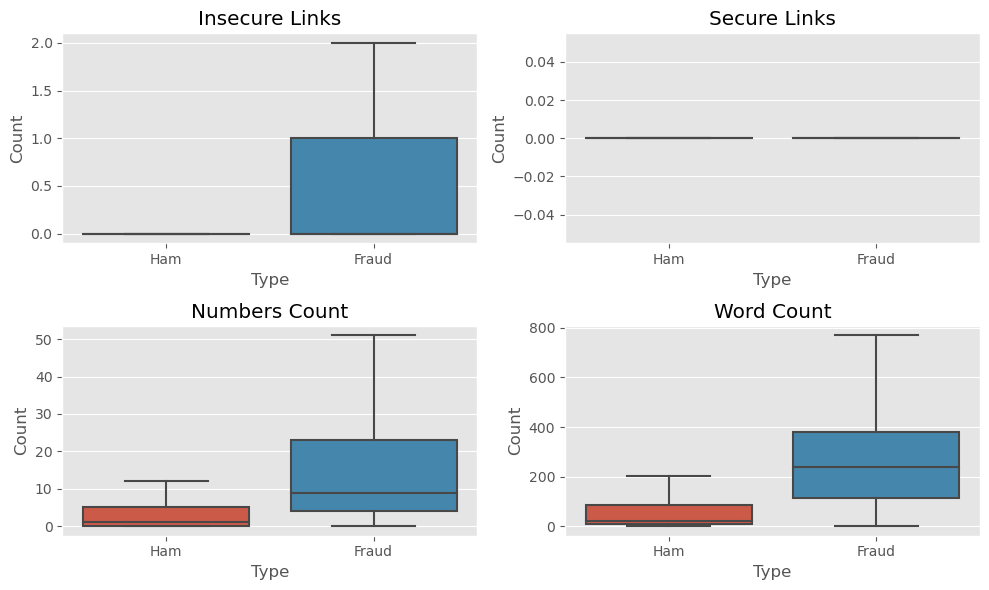

In [130]:
# Set up subplots to display data
fig, axes = plt.subplots(2, 2, figsize=(10, 6))

# Initialize subplot
plt.subplot(2, 2, 1)
# Create a box plot contrasting unsecured links between fraud and non fraud emails
snsplot = sns.boxplot(
    x='Fraud',
    y='unsecure_link_count',
    data=plot_df,
    showfliers=False
)
# Set up labels for plot
plt.title('Insecure Links')
plt.ylabel('Count')
plt.xlabel('Type')

# Initialize subplot
plt.subplot(2, 2, 2)
# Create a box plot contrasting secured links between fraud and non fraud emails
snsplot = sns.boxplot(
    x='Fraud',
    y='secure_link_count',
    data=plot_df,
    showfliers=False
)
# Set up labels for plot
plt.title('Secure Links')
plt.ylabel('Count')
plt.xlabel('Type')

# Initialize subplot
plt.subplot(2, 2, 3)
# Create a box plot contrasting number counts between fraud and non fraud emails
snsplot = sns.boxplot(
    x='Fraud',
    y='numbers_count',
    data=plot_df,
    showfliers=False
)
# Set up labels for plot
plt.title('Numbers Count')
plt.ylabel('Count')
plt.xlabel('Type')

# Initialize subplot
plt.subplot(2, 2, 4)
# Create a box plot contrasting number counts between fraud and non fraud emails
snsplot = sns.boxplot(
    x='Fraud',
    y='word_count',
    data=plot_df,
    showfliers=False
)
# Set up labels for plot
plt.title('Word Count')
plt.ylabel('Count')
plt.xlabel('Type')

# Set up layout for figures
fig.tight_layout()

# Show the plots
plt.show()

As demonstrated by the box plots above, there is a tendency for Fraud emails to have more insecure links, more numbers mentioned and more words overall. These insights could prove useful in any models built using this data.

In [131]:
# Save the subplot images
fig.savefig('./img/cont_var_counts', bbox_inches="tight")

### Compare Fraud to Ham Counts

Now that the word counts for fraud and ham have been looked at individually, the word counts should be compared for words across both categories to see any relative differences. To do this, the two summed data sets will be combined on for the words that appear and the counts compared.

In [132]:
# Create a copy of the ham word sum data frame
ham_word_formatted = ham_word_sum_df.copy()
# Reset the index for the data frame so the words in the index become a new column
ham_word_formatted = ham_word_formatted.reset_index()
# Change the name of the 'index' column to 'Word' and the 'counts' column to 'Ham'
ham_word_formatted = ham_word_formatted.rename({'index': 'Word', 'counts': 'Ham'}, axis=1)
# Create a copy of the ham word sum data frame
fraud_word_formatted = fraud_word_sum_df.copy()
# Reset the index for the data frame so the words in the index become a new column
fraud_word_formatted = fraud_word_formatted.reset_index()
# Change the name of the 'index' column to 'Word' and the 'counts' column to 'Ham'
fraud_word_formatted = fraud_word_formatted.rename({'index': 'Word', 'counts': 'Fraud'}, axis=1)

In [133]:
# Merge the summed word data frames for each type together for each word
top_comparison_count_df = pd.merge(left=ham_word_formatted, right=fraud_word_formatted, how='outer', on='Word')
# Replace any NA values with 0 since an NA represents no count for that category
top_comparison_count_df.fillna(0, inplace=True)

In [134]:
# Inspect the resulting comparison data frame
top_comparison_count_df

,Word,Ham,Fraud
0,one,1983.0,2423.0
1,would,1899.0,1589.0
2,time,1892.0,1394.0
3,new,1792.0,1023.0
4,state,1758.0,768.0
...,...,...,...
12376,revent,0.0,1.0
12377,revend,0.0,1.0
12378,reve,0.0,1.0
12379,retun,0.0,1.0


Now that the word counts for each category have been added to a data frame, the counts for each category for the top 10 ham words can be examined.

In [135]:
# Sort the values in descending order by the 'Ham' counts and take the top 10 entries
top_ham_comparison_count_df = top_comparison_count_df.sort_values(by='Ham', ascending=False).head(10)

In [136]:
# User the 'Melt' command to turn the Ham and Fraud columns into a flag column with the value in a new column
# and capitalize all column names
top_ham_compare_plot_pd = top_ham_comparison_count_df.melt(id_vars='Word').rename(columns=str.title)

In [137]:
# Inspect the resulting data frame
top_ham_compare_plot_pd

,Word,Variable,Value
0,one,Ham,1983.0
1,would,Ham,1899.0
2,time,Ham,1892.0
3,new,Ham,1792.0
4,state,Ham,1758.0
5,work,Ham,1739.0
6,get,Ham,1667.0
7,list,Ham,1531.0
8,like,Ham,1529.0
9,use,Ham,1468.0


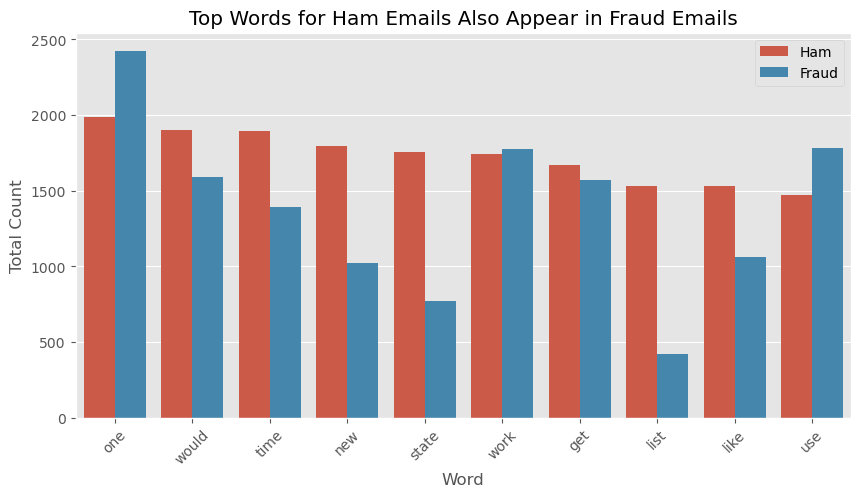

In [138]:
# Initialize a plotting figure
plt.figure(figsize=(10, 5))
# Create a bar plot showing the word counts for the Ham and Fraud categories
snsplot = sns.barplot(x='Word', y='Value', hue='Variable', data=top_ham_compare_plot_pd)
# Add plot labels and legend
plt.title("Top Words for Ham Emails Also Appear in Fraud Emails")
plt.xlabel('Word')
plt.ylabel('Total Count')
plt.legend()
# Format the chart x-ticks
plt.xticks(rotation=45)
# Display the plot
plt.show()

Based on the resulting chart, it's clear that the top words used in ham emails tend to have comparable uses in fraud emails, with a few exceptions.

In [139]:
# Save the plot to a file
snsplot.figure.savefig('./img/top_ten_ham', bbox_inches="tight")

Now that the top 10 ham words have been compared, the counts for the top 10 fraud words should also be examined.

In [140]:
# Sort the values in descending order by the 'Fraud' counts and take the top 10 entries
top_fraud_comparison_count_df = top_comparison_count_df.sort_values(by='Fraud', ascending=False).head(10)

In [141]:
# User the 'Melt' command to turn the Ham and Fraud columns into a flag column with the value in a new column
# and capitalize all column names
top_fraud_compare_plot_pd = top_fraud_comparison_count_df.melt(id_vars='Word').rename(columns=str.title)

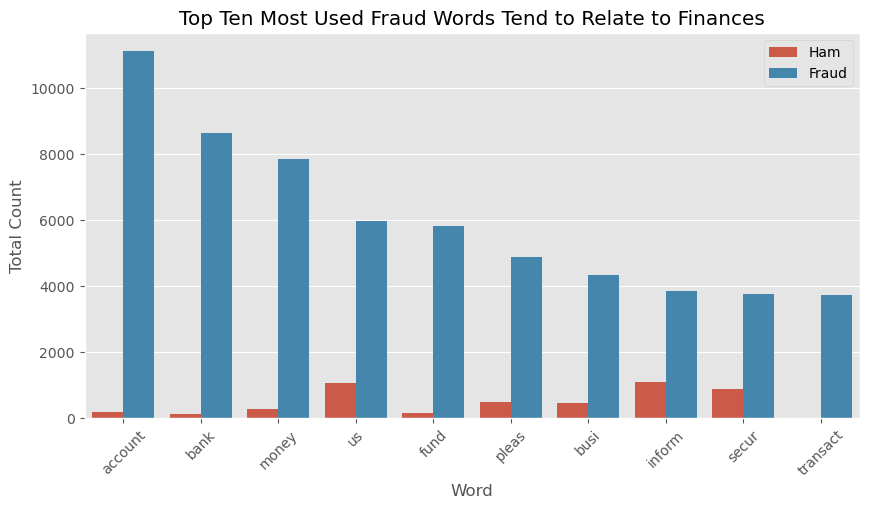

In [142]:
# Initialize the plot
plt.figure(figsize=(10, 5))
# Create a bar plot showing the word counts for the Ham and Fraud categories
snsplot = sns.barplot(x='Word', y='Value', hue='Variable', data=top_fraud_compare_plot_pd)
# Add titles, labels and legend
plt.title('Top Ten Most Used Fraud Words Tend to Relate to Finances')
plt.xlabel('Word')
plt.ylabel('Total Count')
plt.legend()
# Format the x ticks
plt.xticks(rotation=45)
# Display the plot
plt.show()

It can be seen from this chart, that certain words are used with far more frequency in fraud emails than ham emails. It is also clear that these words appear with a much higher frequency than the top words for ham emails. This will likely prove very useful for differentiating fraud emails for any models built using this information.

In [143]:
# Save the resulting figure
snsplot.figure.savefig('./img/top_ten_fraud', bbox_inches="tight")

## Check for Correlations Between Variables

Finally, any correlations between variables should be examined. This will determine if the validity of the assumptions required for linear models (such as linear regression) to be used for classification.

In [144]:
# Initialize the count vectorizer with the custom tokenizer
remainder_vectorizer = CountVectorizer(
    tokenizer=custom_tokenizer,
    min_df=0.05,
)
# Fit the transformer on the content of the remainder
remainder_vectorizer.fit(X_remainder['content'])
# Get the count vectorized content of the remainder
remainder_vectorized = remainder_vectorizer.transform(X_remainder['content'])

In [145]:
# Create a data frame for the vectorized remainder
remainder_words_df = pd.DataFrame(remainder_vectorized.todense(), columns=remainder_vectorizer.get_feature_names_out())
# Combine word data frame with other entries
X_rem_words = pd.concat([remainder_words_df, X_remainder], axis=1)
# Drop the content column
X_rem_words.drop(columns=['content'], inplace=True)

In [146]:
# Check data frame head
X_rem_words.head(5)

,abl,accept,access,accord,account,actual,address,agre,agreement,along,also,amount,anoth,arrang,ask,assist,assur,attent,back,bank,base,behalf,believ,beneficiari,best,better,bless,busi,call,care,case,chang,choos,claim,click,client,close,come,commun,compani,complet,concern,confid,confidenti,confirm,contact,corpor,could,countri,cours,current,custom,day,deal,dear,death,deceas,decid,depart,deposit,develop,direct,discov,discuss,done,due,easi,enabl,end,even,everi,execut,fact,faith,famili,father,file,final,financi,find,first,five,follow,foreign,form,former,forward,free,friend,full,fund,futur,gener,get,give,given,go,god,good,got,govern,great,group,hear,help,henc,home,hope,hous,howev,hundr,id,immedi,import,includ,inform,interest,intern,invest,involv,issu,keep,kin,know,last,late,law,leav,left,legal,let,letter,life,like,link,list,live,long,look,made,mail,mailman,make,manag,mani,matter,may,meet,member,messag,might,million,money,move,much,must,name,nation,necessari,need,net,never,new,next,note,number,offer,offic,offici,old,one,open,oper,order,part,partner,peopl,person,phone,place,pleas,polici,polit,posit,possibl,present,presid,privat,problem,process,propos,protect,provid,put,read,real,reason,receiv,recent,relat,releas,reliabl,repli,request,requir,reserv,respect,respons,result,right,risk,run,safe,said,say,search,secur,see,seek,send,sent,servic,set,shall,share,sinc,sincer,sir,site,son,soon,stand,start,state,still,success,sum,support,sure,system,take,telephon,th,thank,therefor,think,though,thousand,three,time,today,told,top,total,transact,transfer,tri,trust,two,understand,unit,updat,upon,urgent,us,use,user,valu,via,visit,want,way,well,wife,wish,within,without,work,world,would,write,wrote,year,unsecure_link_count,secure_link_count,numbers_count,word_count
0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,4,0,0,1,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,6,229
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,59
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,5
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,

In [147]:
# Look at correlations between variables in remainder dataframe
X_rem_words.corr().style.background_gradient()

Examining the correlation table, there are appear to be strong correlations between certain words, with values reaching over 0.5. This should be kept in mind when building models for this problem, and properly addressed for any models such as logistic regression which rely on little collinearity between variables.

## Conclusions

As a result of the analysis between the fraudulent and ham emails for this data, there is a clear comparative prevalence in the use of certain words in fraud emails. These words, often referring to finances, money and accounts, will likely prove useful for any models built using this data. In terms of 2 to 3 word n-grams the words that appear tend to be redundant with single word usages and provide little semantic differences and as such will likely not be used in further modeling. In terms of word, link and number counts, the fraud emails tend to have higher values in all three categories, which could also be used as a potential identifier. Finally, when looking at the correlations in the transformed data, there is a very high correlation between certain words in the data, which should be accounted for in any models built using this data.